# En este proyecto se obtuvieron fotografias de espectros experimentales de ciertas muestras . Con el software ImageJ se obtuvieron los datos de intensidad que se observan en las siguientes gráficas. Se realizó un análisis para convertir las coordenadas espaciales del eje horizontal en longitudes de onda. Posteriormente se hicieron comparaciones con otros datos experimentales para observar si las longitudes de onda obtenidas y las reportadas en las bases de datos aceptadas coincidían. Se describe con mayor detalle este proceso en el pdf "Reporte".

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.offsetbox import (TextArea, DrawingArea, OffsetImage, AnnotationBbox)
from matplotlib.cbook import get_sample_data
from jupyterthemes import jtplot
import math as mt
from astropy.modeling import models, fitting

rojo = '#e31751'
azul = '#1b88fa'
amarillo = '#fff23b'
morado = '#e926ff'
verde = '#00f024'
linewidth = 2.5
jtplot.style(theme='oceans16', context = 'talk', figsize = (15, 10), fscale = 3., ticks = True, grid = False)

# LaTeX
plt.rcParams['text.usetex'] = True
plt.rc('font', family='serif')
plt.rc('text', usetex=True)

font = {'family': 'serif',
        'weight': 'normal',
        'fontstyle': 'italic',
        }

In [2]:
def linear_regression(X, Y):
        n = len(X)
        m = len(Y)
        assert(n == m)
        sx = 0.0
        sy = 0.0
        for (x, y) in zip(X, Y):
            sx = sx + x**2
            sy = sy + y**2
        r = (n*np.dot(X, Y) - sum(X)*sum(Y)) / \
            np.sqrt((n*sx-(sum(X))**2)*(n*sy-(sum(Y))**2))

        m = (n*np.dot(X, Y) - sum(X)*sum(Y))/(n*sx-(sum(X))**2)

        b = (sx*sum(Y) - np.dot(X, Y)*sum(X))/(n*sx - (sum(X))**2)
        return m, b, r

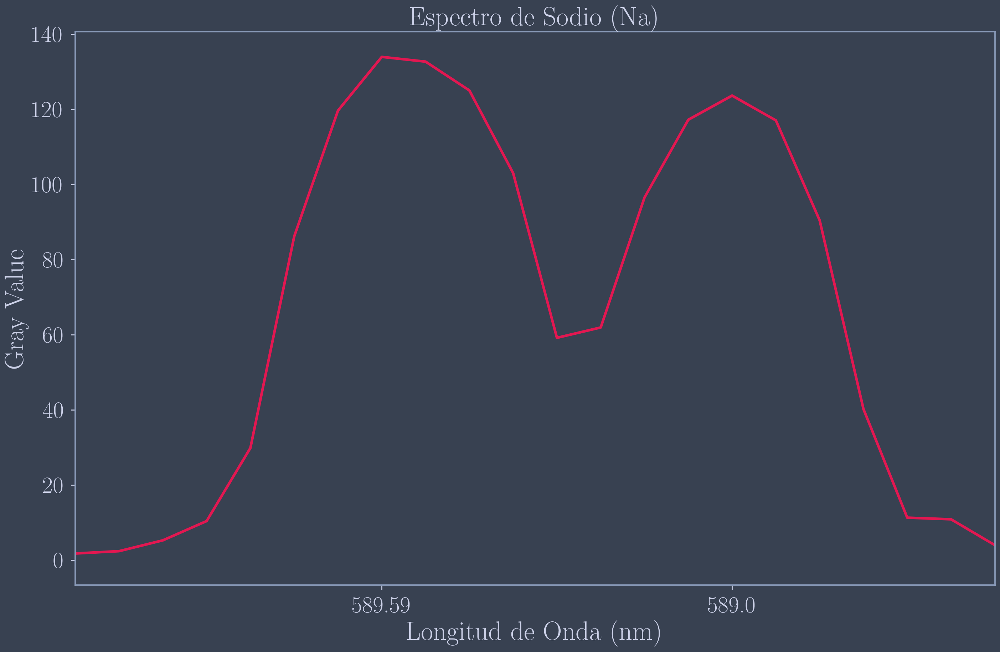

In [3]:
Na = pd.read_csv('DataSets/Na.csv', sep=',')
max1 = Na[Na['Distance_(pixels)'] <= 130]['Gray_Value'].max()
max2 = Na[(Na['Distance_(pixels)'] > 130)]['Gray_Value'].max()
max_distance_pixels = [Na[Na['Gray_Value'] == max1]['Distance_(pixels)'].min(),
                       Na[Na['Gray_Value'] == max2]['Distance_(pixels)'].min()]
max_distance_nm = [589.592424, 588.995095]

#Definicion de funciones de relacion entre distancias
def distance_nm(x):
    max_distance_nm = [589.592424, 588.995095]
    X1 = max_distance_pixels ; Y1 = max_distance_nm
    m, b, r = linear_regression(X1, Y1)
    return m*x + b
fig, ax = plt.subplots(dpi=150)
ax.plot(Na['Distance_(pixels)'], Na['Gray_Value'], linewidth=linewidth+1, color = rojo)
ax.set_xlabel('Longitud de Onda (nm)')
ax.set_ylabel('Gray Value')
ax.set_title('Espectro de Sodio (Na)')
ax.set_xlim(117,138)

xticks = max_distance_pixels
xlabels = max_distance_nm
ax.set_xticks(xticks)
ax.set_xticklabels(np.round(xlabels,2))
fig.tight_layout()
plt.show()

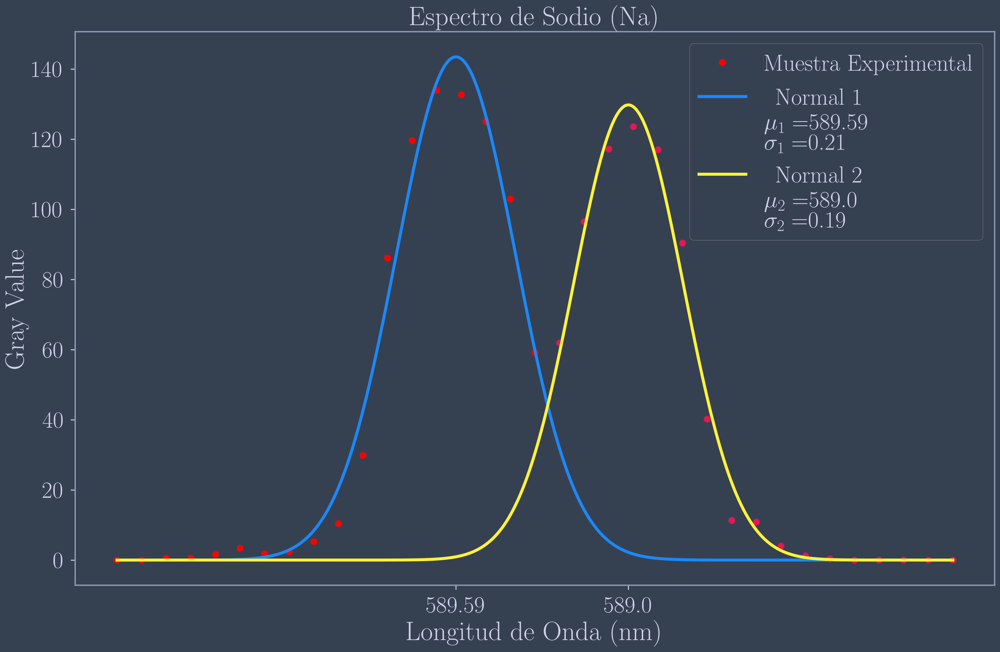

In [4]:
# Subconjunto de datos para ajustar una función gaussiana al primer pico
linewidth = 4
π = mt.pi
x_rightmin = Na[(Na['Distance_(pixels)'] > 127)  & (Na['Distance_(pixels)'] <= 130)]['Distance_(pixels)'].min()
# Subconjunto de datos para ajustar una gaussiana al primer pico
x_gaussian1 = Na[(Na['Distance_(pixels)'] > 110) & (Na['Distance_(pixels)'] <= x_rightmin)]['Distance_(pixels)']
y_gaussian1 = Na[(Na['Distance_(pixels)'] > 110) & (Na['Distance_(pixels)'] <= x_rightmin)]['Gray_Value']

# Subconjunto de datos para ajustar una gaussiana al segundo pico
x_gaussian2 = Na[(Na['Distance_(pixels)'] > x_rightmin) & (Na['Distance_(pixels)'] <= 145)]['Distance_(pixels)']
y_gaussian2 = Na[(Na['Distance_(pixels)'] > x_rightmin) & (Na['Distance_(pixels)'] <= 145)]['Gray_Value']

# Parámetros de primer pico
μ1 = np.mean(x_gaussian1); σ1 = np.std(x_gaussian1); a1 = 1/(σ1*np.sqrt(2*π))
# Fit the data using a Gaussian
g1_init = models.Gaussian1D(amplitude=a1, mean=μ1, stddev=σ1)
fit_g1 = fitting.LevMarLSQFitter()
g1 = fit_g1(g1_init, x_gaussian1, y_gaussian1)
# Update Parameters
μ1 = g1.mean.value; σ1 = g1.stddev.value; a1 = g1.amplitude.value


# Parámetros de este segundo pico
μ2 = np.mean(x_gaussian2); σ2 = np.std(x_gaussian2); a2 = 1/(σ2*np.sqrt(2*π))
# Fit the data using a Gaussia
g2_init = models.Gaussian1D(amplitude=a2, mean=μ2, stddev=σ2)
fit_g2 = fitting.LevMarLSQFitter()
g2 = fit_g2(g2_init, x_gaussian2, y_gaussian2)
# Update Parameters
μ2 = g2.mean.value; σ2 = g2.stddev.value; a2 = g2.amplitude.value


#Redefinicion de funciones de relacion entre distancias pero considerando solo los datos de las gaussianas
def distance_nm(x):
    max_distance_nm = [589.592424, 588.995095]
    X2 = np.array([μ1, μ2]) ; Y2 = max_distance_nm
    m, b, r = linear_regression(X2, Y2)
    return m*x + b

# def separacion_nm(σ):
#     m = abs(abs(distance_nm(μ2)-distance_nm(μ1))/abs(μ2-μ1))
#     return m*σ

def separacion_nm(σ):
    m = abs( abs(589.592424 - 588.995095)/abs(μ2-μ1))
    return m*σ

##################################
plt.figure(dpi = 300)
plt.plot(x_gaussian1, y_gaussian1, 'ko', color='red', label = r'Muestra Experimental')
x = np.linspace(x_gaussian1.min(), x_gaussian2.max(), 1000)
plt.plot(x, g1(x), label=r'Normal 1 \\' + r'\\'
                        + r'$\mu_1 = $'+str(round(distance_nm(μ1), 2)) + r'\\'
                        + r'$\sigma_1 = $'+str(round(separacion_nm(σ1), 2)) + r'\\',
        color = azul, linewidth = linewidth)


plt.plot(x_gaussian2, y_gaussian2, 'ko', color = rojo)
plt.plot(x, g2(x), label=r'Normal 2 \\' + r'\\'
                        + r'$\mu_2 = $'+str(round(distance_nm(μ2), 2)) + r'\\'
                        + r'$\sigma_2=$' +str(round(separacion_nm(σ2), 2)),
        color = amarillo, linewidth = linewidth)
plt.xlabel('Longitud de Onda (nm)'); plt.ylabel('Gray Value'); plt.legend(loc = 'best')

xticks=np.array([μ1, μ2])
xlabels=np.round(distance_nm(xticks), 2)
plt.xticks(xticks, xlabels)
plt.title('Espectro de Sodio (Na)')
plt.tight_layout()
plt.savefig('gaussianas_sodio.png')
plt.show()

In [5]:
max_distance_nm = [589.592424, 588.995095]
X2 = np.array([μ1, μ2]) ; Y2 = max_distance_nm
m, b, r = linear_regression(X2, Y2) 
print(m, b)

-0.08516570749518873 600.2200445085364


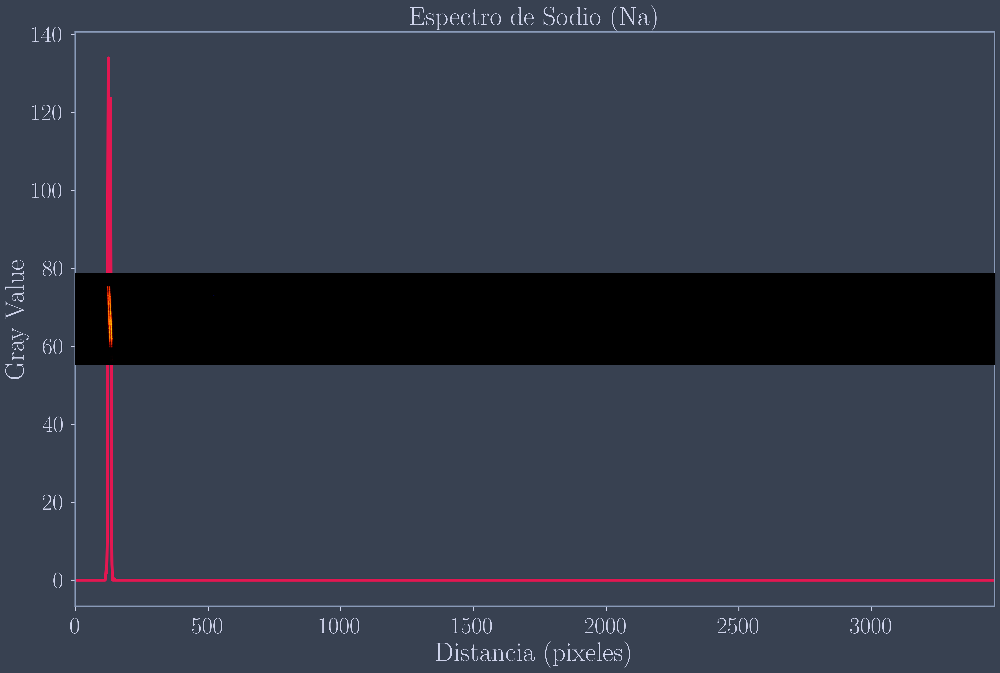

In [6]:
fig, ax = plt.subplots(dpi = 300)
ax.plot(Na['Distance_(pixels)'], Na['Gray_Value'] , color = rojo, linewidth = linewidth)
ax.set_xlabel('Distancia (pixeles)')
ax.set_ylabel('Gray Value')

sticks = np.arange(0,3500,500)
labels = distance_nm(sticks)

ax2 = ax.twinx()
img = plt.imread('Na.png')
ax2.imshow(img)
ax2.spines['left'].set_visible(False); ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False); ax2.spines['bottom'].set_visible(False)
ax2.set_yticks([])

fig.tight_layout()
plt.title('Espectro de Sodio (Na)')
plt.savefig('Na_spectrum.png')
plt.show()

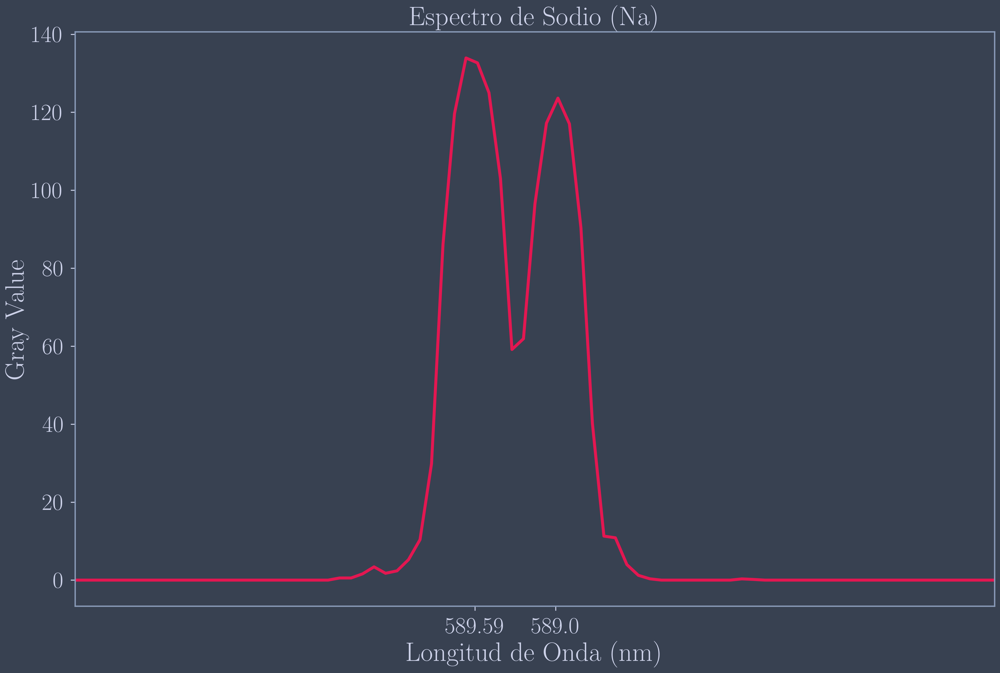

In [7]:
fig, ax = plt.subplots(dpi = 300)
ax.plot(Na['Distance_(pixels)'], Na['Gray_Value'] , color = rojo, linewidth = linewidth)
ax.set_xlabel('Longitud de Onda (nm)');ax.set_ylabel('Gray Value')
plt.xlim(90,170)

xticks=np.array([μ1, μ2])
xlabels=np.round(distance_nm(xticks), 2)

ax.set_xticks(xticks)
ax.set_xticklabels(xlabels)    

plt.tight_layout()

plt.title('Espectro de Sodio (Na)')
plt.savefig('Na_spectrum2.png')
plt.show()

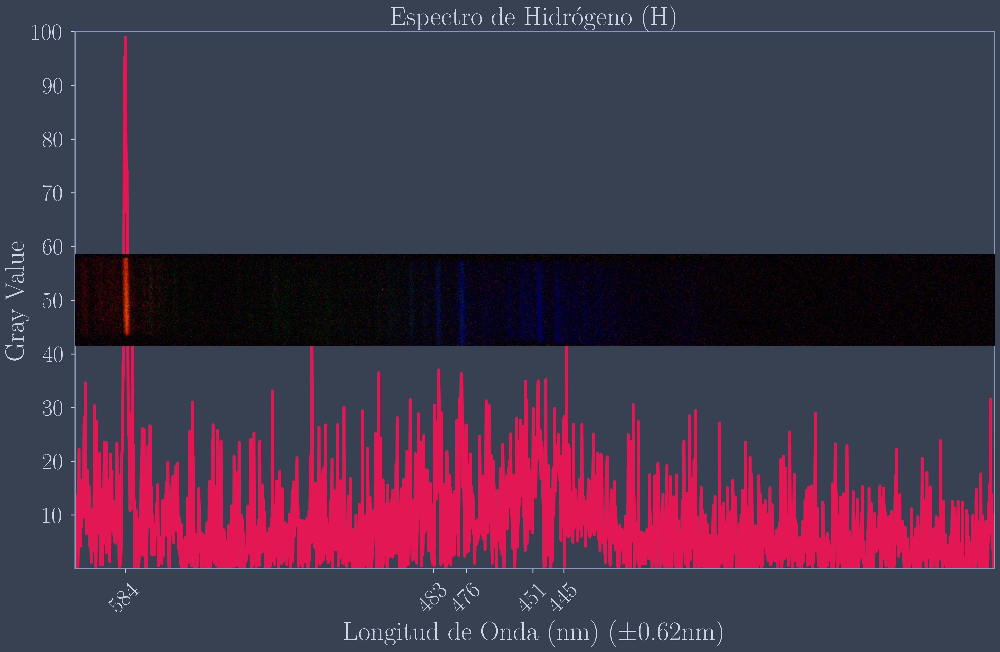

In [8]:
incertidumbre = 0.62
H = pd.read_csv('DataSets/H.csv', sep=',')

fig, ax = plt.subplots(dpi = 300)
ax.plot(H['Distance_(pixels)'], H['Gray_Value'] , color = rojo, linewidth = linewidth)
ax.set_yticks(np.arange(10, 110, 10))
ax.set_ylim(0,100)
ax.set_xlim(H['Distance_(pixels)'].min(),H['Distance_(pixels)'].max())
ax.set_xlabel(r'Longitud de Onda (nm)' + r'    $(\pm$' + str(round(incertidumbre, 2))+r'nm)')
ax.set_ylabel('Gray Value')


h_max_gray_values = [H[(H['Gray_Value'] > 20) & (H['Distance_(pixels)'] > 100)    & (H['Distance_(pixels)'] < 300)]['Gray_Value'].max(),
       H[(H['Gray_Value'] > 20) & (H['Distance_(pixels)'] > 1300) & (H['Distance_(pixels)'] < 1400)]['Gray_Value'].max(),
       H[(H['Gray_Value'] > 20) & (H['Distance_(pixels)'] > 1400) & (H['Distance_(pixels)'] < 1500)]['Gray_Value'].max(),
       H[(H['Gray_Value'] > 20) & (H['Distance_(pixels)'] > 1720) & (H['Distance_(pixels)'] < 1760)]['Gray_Value'].max(),
       H[(H['Gray_Value'] > 20) & (H['Distance_(pixels)'] > 1810) & (H['Distance_(pixels)'] < 1825)]['Gray_Value'].max()]
h_peaks_pixels = [H[H['Gray_Value']==h_max_gray_values[0]]['Distance_(pixels)'].max(),
                  H[H['Gray_Value']==h_max_gray_values[1]]['Distance_(pixels)'].max(),
                  H[H['Gray_Value']==h_max_gray_values[2]]['Distance_(pixels)'].max(),
                  H[H['Gray_Value']==h_max_gray_values[3]]['Distance_(pixels)'].max(),
                  H[H['Gray_Value']==h_max_gray_values[4]]['Distance_(pixels)'].max()]
h_peaks_nm = distance_nm(np.array(h_peaks_pixels))

des = 20
xticks = h_peaks_pixels
xlabels = []
for x in h_peaks_nm:
    xlabels.append(str(int(x)))
xticks2 = [xticks[0],xticks[1]-des,xticks[2]+des,xticks[3]-des,xticks[4]+des]

ax.set_xticks(xticks2)    
ax.set_xticklabels(xlabels, rotation = 45)    

    
ax2 = ax.twinx()
img = plt.imread('H.png')
ax2.imshow(img)
ax2.spines['left'].set_visible(False); ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False); ax2.spines['bottom'].set_visible(False)
ax2.set_yticks([])
plt.title('Espectro de Hidrógeno (H)')
fig.tight_layout()
plt.savefig('H_spectrum.jpg')

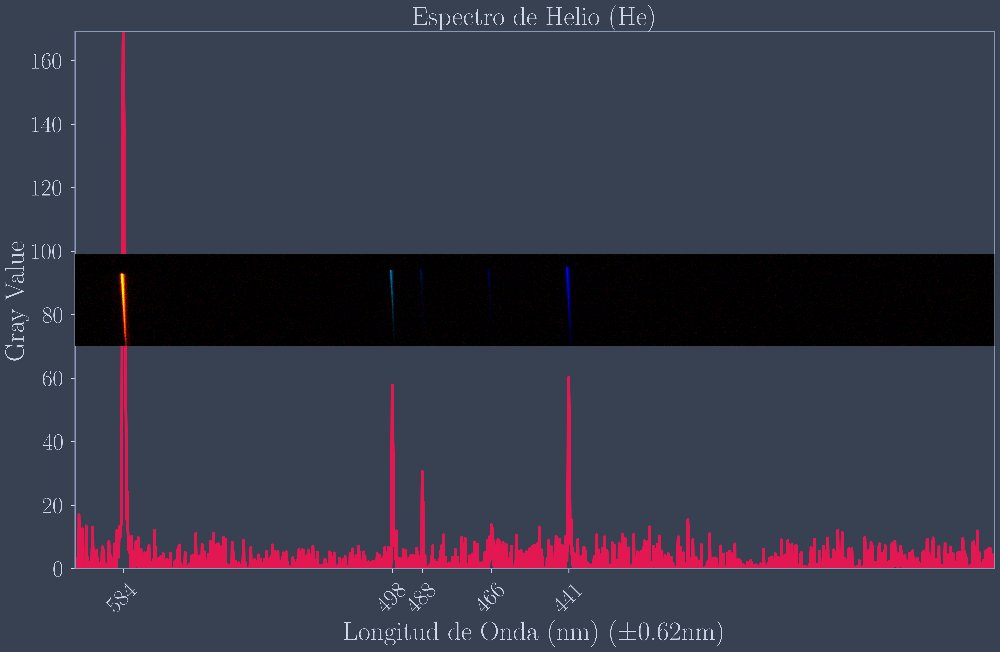

In [9]:
He = pd.read_csv('DataSets/He.csv', sep=',')

fig, ax = plt.subplots(dpi = 300)
ax.plot(He['Distance_(pixels)'], He['Gray_Value'] , color = rojo, linewidth = linewidth)
ax.set_xlim(He['Distance_(pixels)'].min(), He['Distance_(pixels)'].max())
ax.set_ylim(0, He['Gray_Value'].max())
ax.set_xlabel('Longitud de Onda (nm)' + r'    $(\pm$' + str(round(incertidumbre, 2))+r'nm)')
ax.set_ylabel('Gray Value')


he_max_gray_values = [He[(He['Gray_Value'] > 20) & (He['Distance_(pixels)'] > 0) & (He['Distance_(pixels)'] < 500)]['Gray_Value'].max(),
                      He[(He['Gray_Value'] > 20) & (He['Distance_(pixels)'] > 1100) & (He['Distance_(pixels)'] < 1200)]['Gray_Value'].max(),
                      He[(He['Gray_Value'] > 20) & (He['Distance_(pixels)'] > 1200) & (He['Distance_(pixels)'] < 1500)]['Gray_Value'].max(),
                      He[(He['Gray_Value'] < 20) & (He['Distance_(pixels)'] > 1500) & (He['Distance_(pixels)'] < 1600)]['Gray_Value'].max(),
                      He[(He['Gray_Value'] > 20) & (He['Distance_(pixels)'] > 1800) & (He['Distance_(pixels)'] < 2000)]['Gray_Value'].max()]
he_peaks_pixels = [He[He['Gray_Value']==he_max_gray_values[0]]['Distance_(pixels)'].max(),
                   He[He['Gray_Value']==he_max_gray_values[1]]['Distance_(pixels)'].max(),
                   He[He['Gray_Value']==he_max_gray_values[2]]['Distance_(pixels)'].max(),
                   He[He['Gray_Value']==he_max_gray_values[3]]['Distance_(pixels)'].max(),
                   He[He['Gray_Value']==he_max_gray_values[4]]['Distance_(pixels)'].max()]
he_peaks_nm = distance_nm(np.array(he_peaks_pixels))
xlabels = []
for x in he_peaks_nm:
    xlabels.append(str(int(x)))
ax.set_xticks(he_peaks_pixels)
ax.set_xticklabels(xlabels, rotation =45)


ax2 = ax.twinx()
img = plt.imread('He.png')
ax2.imshow(img)
ax2.spines['left'].set_visible(False); ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False); ax2.spines['bottom'].set_visible(False)
ax2.set_yticks([])
plt.title('Espectro de Helio (He)')
# plt.show()
fig.tight_layout()
plt.savefig('He_spectrum.jpg')

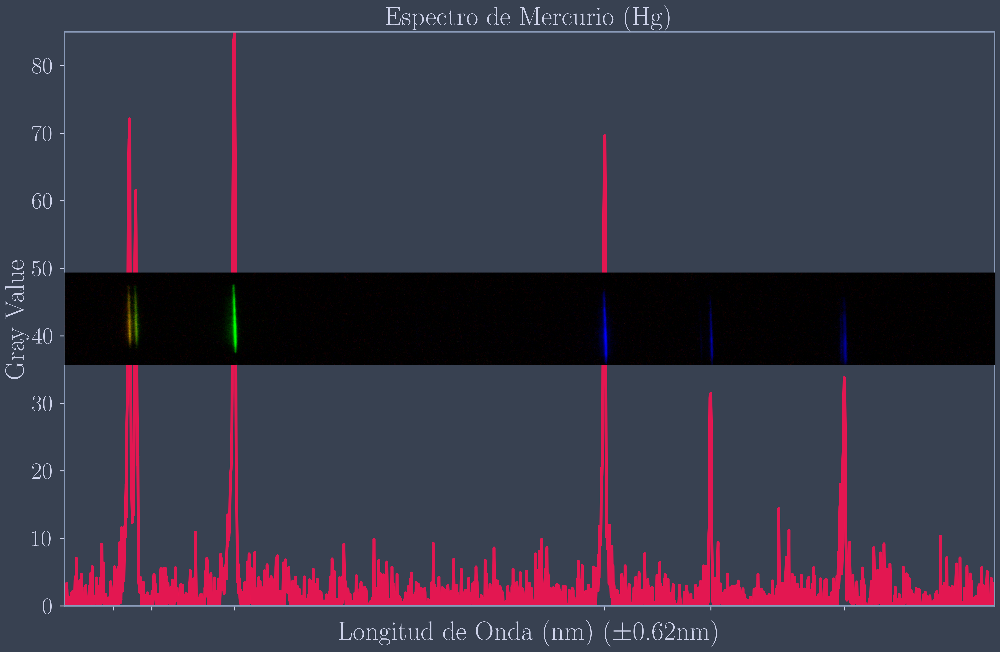

In [12]:
Hg = pd.read_csv('DataSets/Hg.csv', sep=',')
fig, ax = plt.subplots(dpi = 300)
ax.plot(Hg['Distance_(pixels)'], Hg['Gray_Value'],color=rojo, linewidth=linewidth)
ax.set_xlim(Hg['Distance_(pixels)'].min(), Hg['Distance_(pixels)'].max())
ax.set_ylim(0, Hg['Gray_Value'].max())
ax.set_xlabel('Longitud de Onda (nm)'+ r'    $(\pm$' + str(round(incertidumbre, 2))+r'nm)')
ax.set_ylabel('Gray Value')



hg_max_gray_values = [Hg[(Hg['Gray_Value'] > 30) & (Hg['Distance_(pixels)'] > 220) & (Hg['Distance_(pixels)'] < 250)]['Gray_Value'].max(),
                   Hg[(Hg['Gray_Value'] > 30) & (Hg['Distance_(pixels)'] > 250) & (Hg['Distance_(pixels)'] < 280)]['Gray_Value'].max(),
                   Hg[(Hg['Gray_Value'] > 30) & (Hg['Distance_(pixels)'] > 500) & (Hg['Distance_(pixels)'] < 1000)]['Gray_Value'].max(),
                   Hg[(Hg['Gray_Value'] > 30) & (Hg['Distance_(pixels)'] > 1800) & (Hg['Distance_(pixels)'] < 2200)]['Gray_Value'].max(),
                   Hg[(Hg['Gray_Value'] > 30) & (Hg['Distance_(pixels)'] > 2300) & (Hg['Distance_(pixels)'] < 2600)]['Gray_Value'].max(),
                   Hg[(Hg['Gray_Value'] > 30) & (Hg['Distance_(pixels)'] > 2800) & (Hg['Distance_(pixels)'] < 3000)]['Gray_Value'].max()]
hg_peaks_pixels = [Hg[Hg['Gray_Value']==hg_max_gray_values[0]]['Distance_(pixels)'].max(),
                      Hg[Hg['Gray_Value']==hg_max_gray_values[1]]['Distance_(pixels)'].max(),
                      Hg[Hg['Gray_Value']==hg_max_gray_values[2]]['Distance_(pixels)'].max(),
                      Hg[Hg['Gray_Value']==hg_max_gray_values[3]]['Distance_(pixels)'].max(),
                      Hg[Hg['Gray_Value']==hg_max_gray_values[4]]['Distance_(pixels)'].max(),
                      Hg[Hg['Gray_Value']==hg_max_gray_values[5]]['Distance_(pixels)'].max()]
hg_peaks_nm = distance_nm(np.array(hg_peaks_pixels))
xticks_positions = [Hg[Hg['Gray_Value']==hg_max_gray_values[0]]['Distance_(pixels)'].max() - 60,
                    Hg[Hg['Gray_Value']==hg_max_gray_values[1]]['Distance_(pixels)'].max() + 60,
                    Hg[Hg['Gray_Value']==hg_max_gray_values[2]]['Distance_(pixels)'].max(),
                    Hg[Hg['Gray_Value']==hg_max_gray_values[3]]['Distance_(pixels)'].max(),
                    Hg[Hg['Gray_Value']==hg_max_gray_values[4]]['Distance_(pixels)'].max(),
                    Hg[Hg['Gray_Value']==hg_max_gray_values[5]]['Distance_(pixels)'].max()]
xlabels = []
# for x in hg_peaks_nm:
#     xlabels.append(str(int(x)))
# ax.set_xticks(xticks)
# ax.set_xticklabels(xlabels)


ax2 = ax.twinx()
img = plt.imread('Hg.png')
ax2.imshow(img)
ax2.spines['left'].set_visible(False)
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)
ax2.spines['bottom'].set_visible(False)
ax2.set_yticks([])
ax2.set_xticks(xticks_positions)
ax2.set_xticklabels(xlabels)
plt.title('Espectro de Mercurio (Hg)')
fig.tight_layout()
plt.savefig('Hg_spectrum.jpg')